In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import glob
import os
import peakutils
import datetime
import warnings
import logging
from jupyterthemes import jtplot

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *

jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('xtick.major', size=6)
plt.rc('ytick.major', size=6)

plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)

In [3]:
asf = dict({'C_1s' : 0.296, 'O_1s' : 0.711, 'N_1s' : 0.477, 'Ba_3d' : 7.49,
            'Au_4f' : 6.250, 'Cl_2p' : 0.891})

In [4]:
def plot_regions(experiments : list, regions : list, colors : list = None):
    """Subplots all regions of a list of experiments (unnormalised)"""
    rows = int(np.ceil(len(regions) / 3))
    cols = 3
    
    fig, ax = plt.subplots(rows, cols, figsize=(16, 8))
    for i,r in enumerate(regions):
        for c,xp in enumerate(experiments):
            j, k = i//3, i%3            
            if i == len(regions) - 1:   # Set labels from last region
                li = plot_region(xp, r, ax=ax[j][k], lb=xp.name)
                if len(colors) > 0: li.set_color(colors[c])
                ax[j][k].set_title('Au_4f')
                ax[j][k].get_legend().remove()
            else:
                li = plot_region(xp, r, ax=ax[j][k], lb='__nolabel__')
                if len(colors) > 0: li.set_color(colors[c])
                ax[j][k].set_title(r)
            cosmetics_plot(ax=ax[j][k], leg = False);
        if len(experiments)%2 == 0:
            ax[j][k].invert_xaxis()
    plt.tight_layout()
    fig.legend()

### Background subtraction class (dev) 

In [344]:
class Background2(object):
    @staticmethod
    def bg_handler(xp, region,  *args, **kwargs):
        x = xp.dfx[region].dropna().energy.values
        y = xp.dfx[region].dropna().counts.values
        return x, y

    @staticmethod
    def edit_xp(xp, region, x, y, ybg, ax = None):
        if ax == None: ax = plt.gca()
        col = plot_region(xp, region, lb=region, ax=ax).get_color()
        ax.plot(x, ybg, '--', color=col, label='__nolabel__')
        cosmetics_plot(ax=ax)
        
        dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
        xpNew = deepcopy(xp)
        xpNew.dfx[region] = dfnew
        return xpNew

    def dec_linear(self, xp, region, *args, **kwargs):
        x, y = self.bg_handler(xp, region, *args, **kwargs)

        ybg = peakutils.baseline(y, deg=1)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_shirley(self, xp, region, maxit=40, **kwargs):
        kwargs['maxit'] = maxit
        x,y = self.bg_handler(xp, region, **kwargs)
        ybg = shirley_loop(x,y, **kwargs)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_2shirley(self, xp, region, xlim, maxit=40, **kwargs):
        x, y = self.bg_handler(xp, region, **kwargs)
        y1 = y[ x >= xlim ]
        x1 = x[ x >= xlim ]
        y2 = y[ x <= xlim ]
        x2 = x[ x <= xlim ]

        ybg1 = shirley_loop(x1, y1, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg2 = shirley_loop(x2, y2, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg = np.append(np.append(ybg1[:-1], np.average([ybg1[-1], ybg2[0]])), ybg2[1:] )
        return self.edit_xp(xp, region, x, y, ybg, **kwargs)

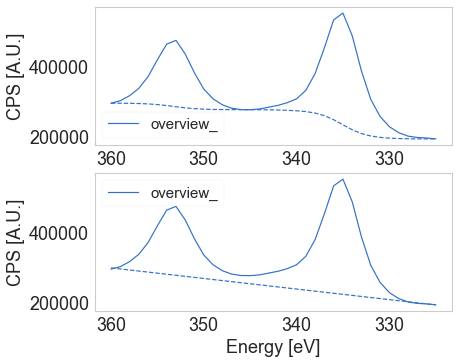

In [345]:
# Background2().dec_linear(xp=experiments[0], region='C_1s')
fig, ax = plt.subplots(2)
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
bg2 = BG2.dec_linear(xp=trim_exps[0], 
                     region='overview_', ax=ax[1])

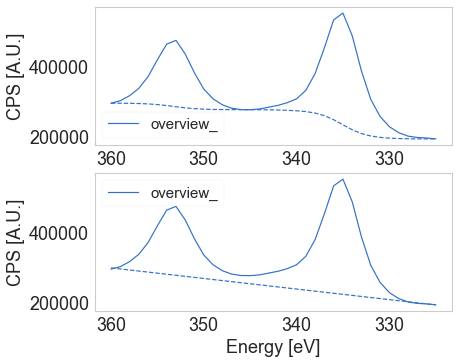

In [346]:
def test_bg_subpots()
    fig, ax = plt.subplots(2)
    BG2 = Background2()
    bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                           xlim = 346, maxit=50, ax=ax[0])
    bglin = BG2.dec_linear(xp=trim_exps[0], 
                         region='overview_', ax=ax[1])

    assert len(ax[0].get_lines()) <= 2, "Too many lines in lin_bg subplot"
    assert len(ax[0].get_lines()) >= 2, "Not enough lines in lin_bg subplot"

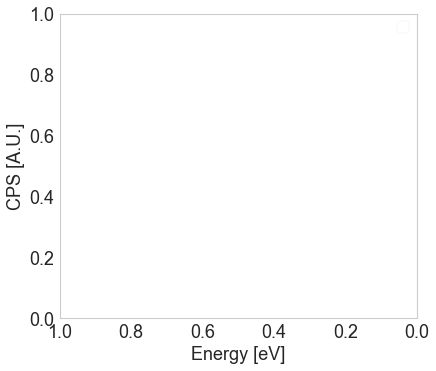

In [360]:
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


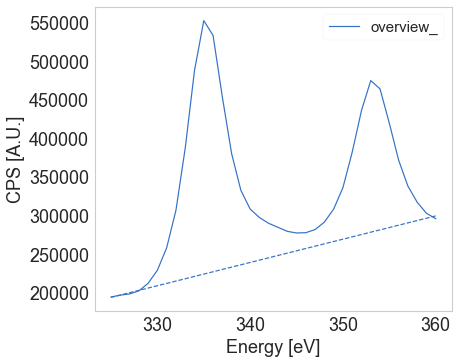

In [361]:
BG2 = Background2()
bg2 = BG2.dec_linear(xp=trim_exps[0], region='overview_')
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


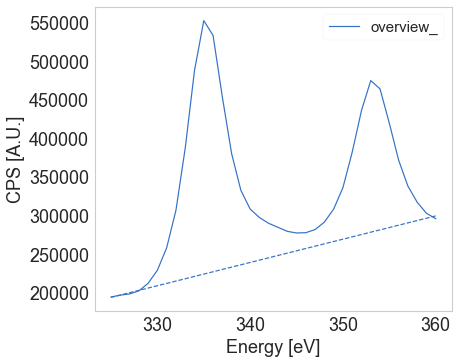

In [364]:
def test_method(method):
    BG2 = Background2()
    bg2 = method(xp=trim_exps[0], region='overview_')
    x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
    x,ybg = BG2.bg_handler(bg2, region='overview_')
    lentest = len(np.where(y < ybg)[0])
    assert lentest == 0, "Background over signal in %i points"%lentest
test_method(Background2().dec_linear)

## Pre-processing of data FBI-Ba++ on Au(788)
1- ALI injections 800 mbar, 1 µM (16-17.10.2019)

2- ALI injections 200 mbar, 1 µM (23-25.10.2019)

3- Dropcast 1 mM (28-30.10.2019)

# ALI injections 800 mbar
40, 80 and 120 pulses

At $t_{on}$ = 50 ms and C = 1µM

## Import data

In [4]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au788_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)
files = files_new[2:6]
files[2], files[3] = files[3], files[2]
for f in files:
    print(os.path.split(f)[1])

20191016_Au(788)_clean.xy
20191016_FBI_FBI_Ba_1uM_40pulse_50ms_Au(788).xy
20191017_FBI_FBI_Ba_1uM_80pulse_50ms_Au(788).xy
20191017_FBI_FBI_Ba_1uM_120pulse_50ms_Au(788).xy


In [5]:
names = ['au_clean', '40pulses_800mbar', '80pulses_800mbar', '120pulses_800mbar']
label = ['Au(788) clean', 'FBI-Ba 40pulses, 800mbar GAr', 'FBI-Ba 80pulses, 800mbar GAr', 'FBI-Ba 120pulses, 800mbar GAr']

experiments = [xps_data_import(path=f, name=n, label=l) for f,n,l in zip(files, names, label)]
experiments[1].name

'40pulses_800mbar'

## Bg subtraction

In [6]:
region = 'overview_'

Text(0.5, 1.0, 'Au 4f')

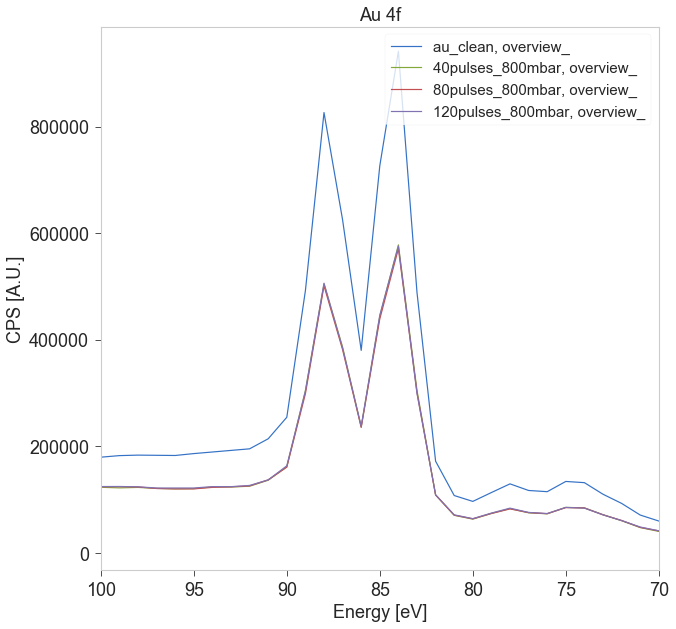

In [7]:
plt.figure(figsize=(10,10))
for xp in experiments:
    plot_region(xp, 'overview_')
plt.xlim(70, 100)
# plt.ylim(1.5e5, 4e5)
cosmetics_plot()
plt.title('Au 4f')

Text(0.5, 1.0, 'Au 4d')

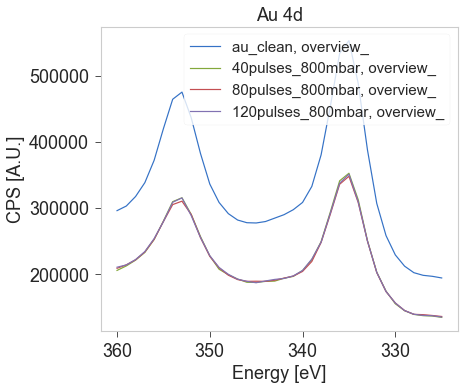

In [8]:
trim_exps = []
for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=360, edw=325)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
cosmetics_plot()
plt.title('Au 4d')

### Subtract double shirley to all Au regions

In [9]:
region = 'overview_'

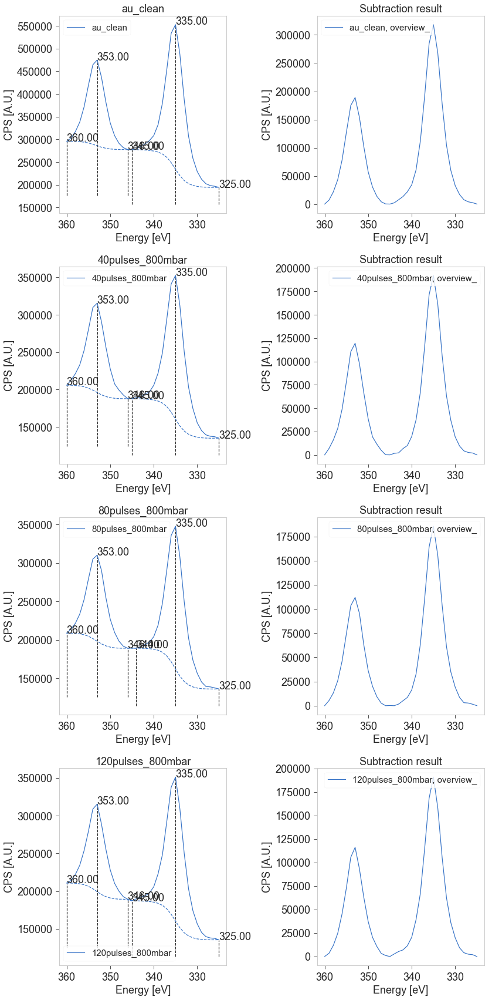

In [10]:
bg_exps = region_2bg_subtract(trim_exps, region=region, xlim=346)

In [11]:
[xp.dfx.columns.levels[0] for xp in trim_exps]

[Index(['Ba_3d', 'C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'overview_'], dtype='object'),
 Index(['Ba_3d', 'C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'overview_'], dtype='object'),
 Index(['Ba_3d', 'C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'overview_'], dtype='object'),
 Index(['Ba_3d', 'C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'overview_'], dtype='object')]

### Bulk subtract background

Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline


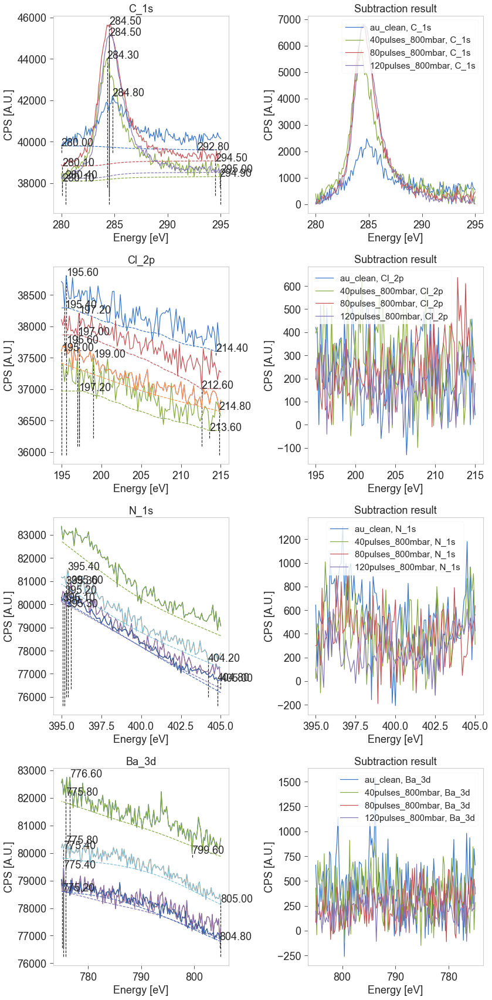

In [12]:
regions = ['C_1s', 'Cl_2p', 'N_1s', 'Ba_3d']
bg_exps = bulk_bg_subtract(bg_exps, regions)

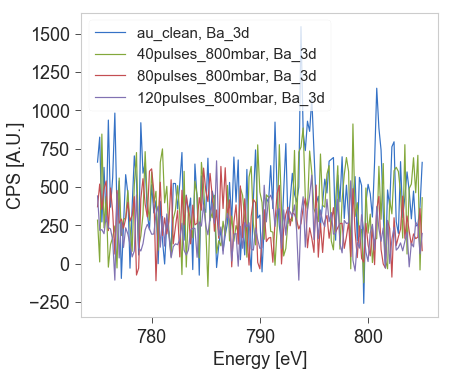

In [13]:
region = 'Ba_3d'
for xp in bg_exps:
    plot_region(xp, region)

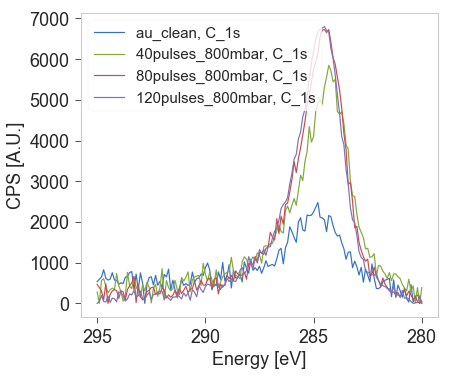

In [14]:
region = 'C_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

### Review Ba bg subtraction

In [95]:
region = 'Ba_3d'

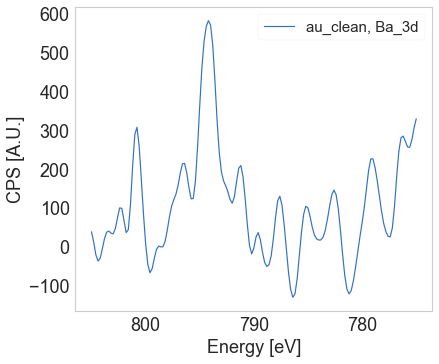

In [176]:
bg_exps[0] = gaussian_smooth(bg_exps[0], region, sigma=2)
plot_region(bg_exps[0], region)

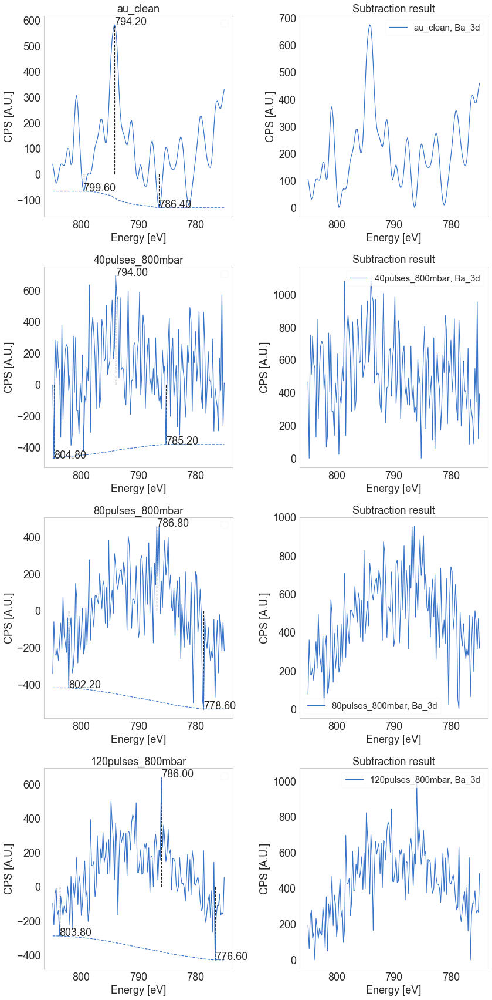

In [177]:
bg_exps = region_bg_subtract(bg_exps, 'Ba_3d')

### Subtract linear and shirley bg to all O 1s regions

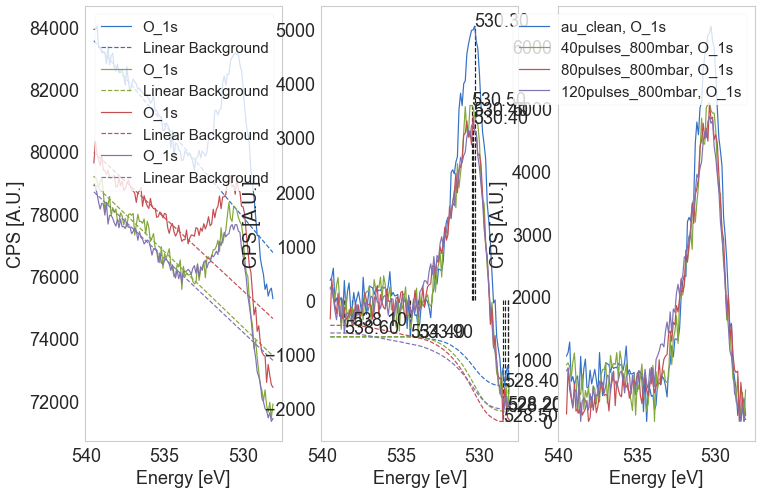

In [178]:
region = 'O_1s'
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=539.5, edw=528)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

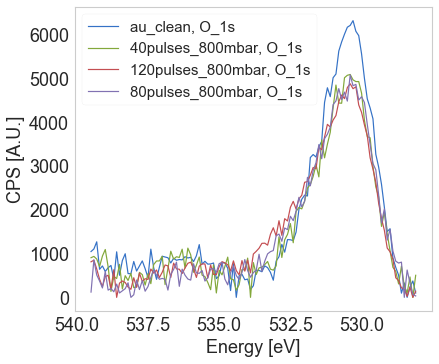

In [101]:
region = 'O_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

## Scale to Au 4f

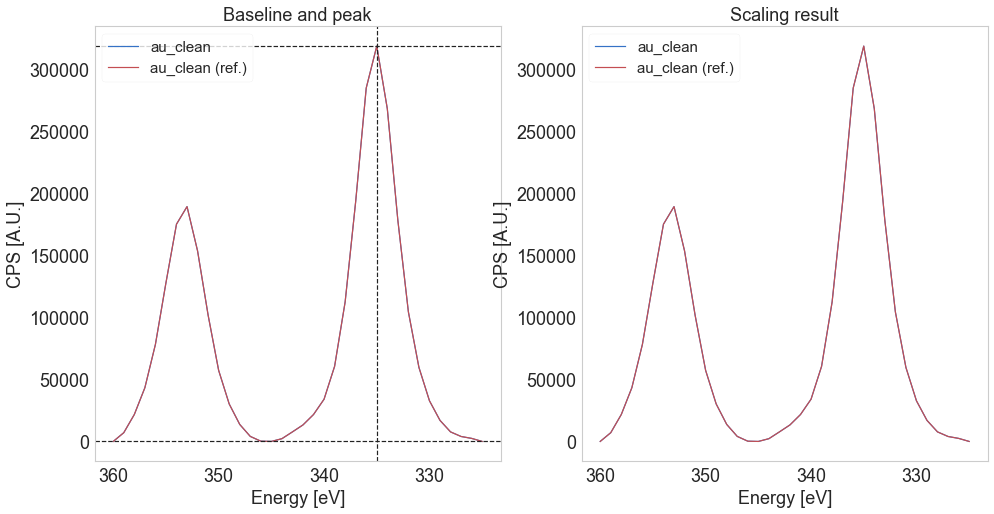

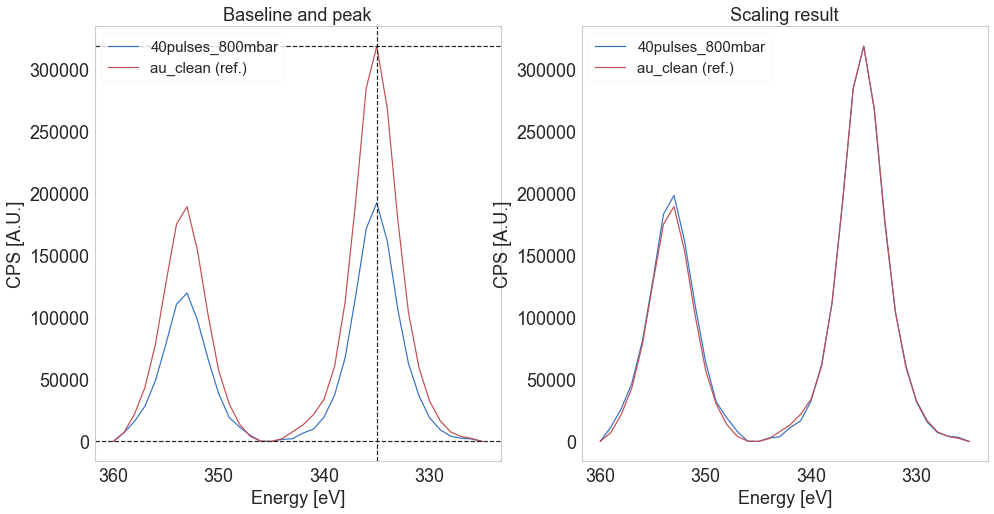

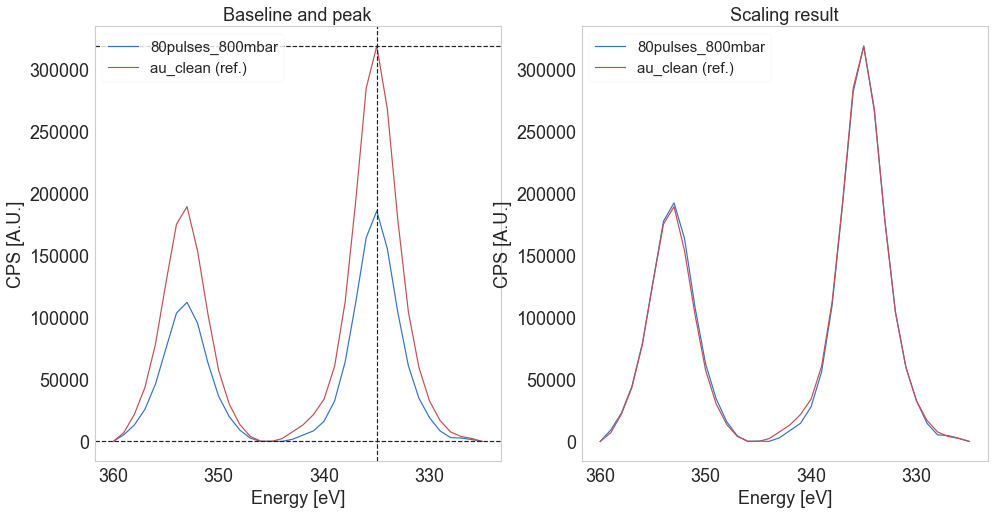

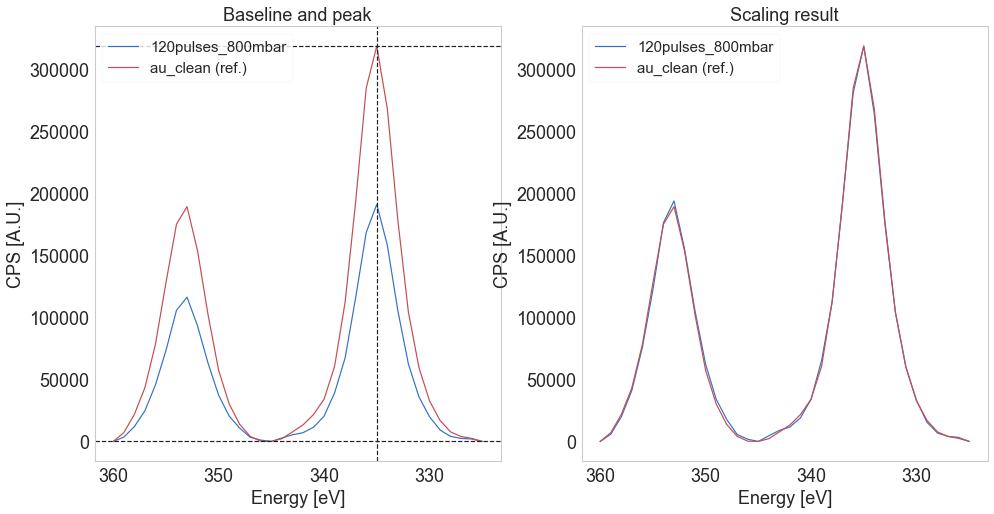

In [184]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'overview_')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

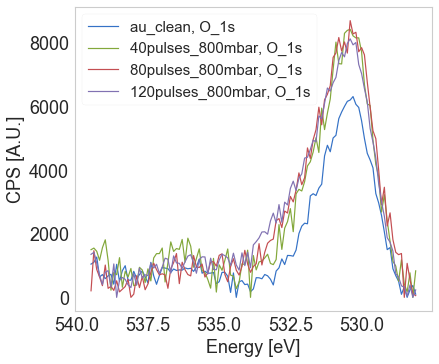

In [180]:
for xp in scaled_exps:
    plot_region(xp, 'O_1s')
cosmetics_plot()

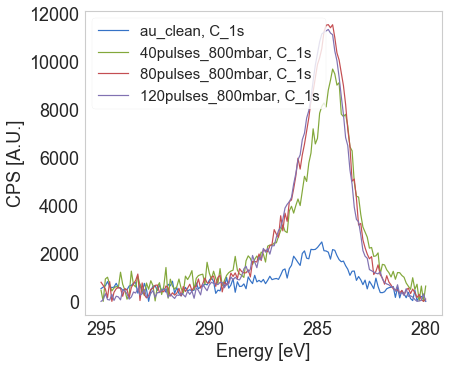

In [181]:
for xp in scaled_exps:
    plot_region(xp, 'C_1s')
cosmetics_plot()

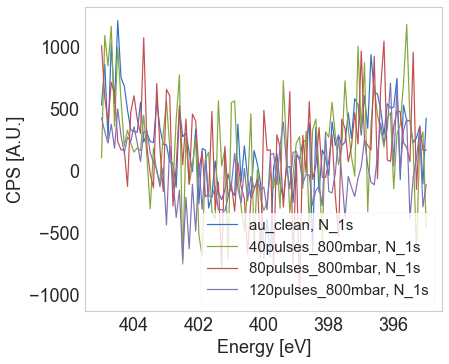

In [182]:
for xp in scaled_exps:
    plot_region(xp, 'N_1s')
cosmetics_plot()

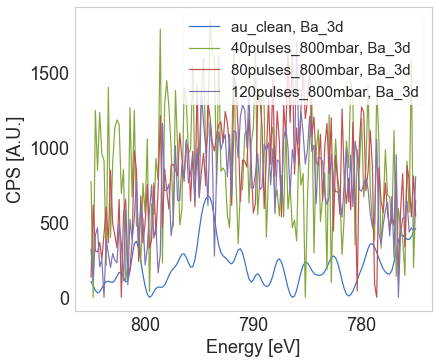

In [183]:
for xp in scaled_exps:
    plot_region(xp, 'Ba_3d')
cosmetics_plot()

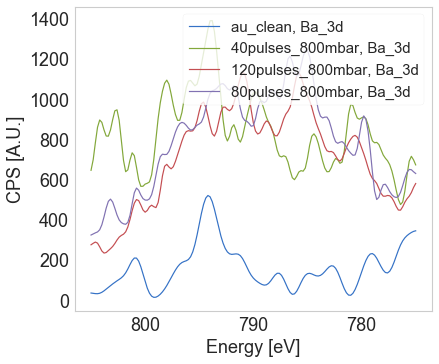

In [106]:
for xp in scaled_exps:
    plot_region(gaussian_smooth(xp, 'Ba_3d'), 'Ba_3d')
cosmetics_plot()

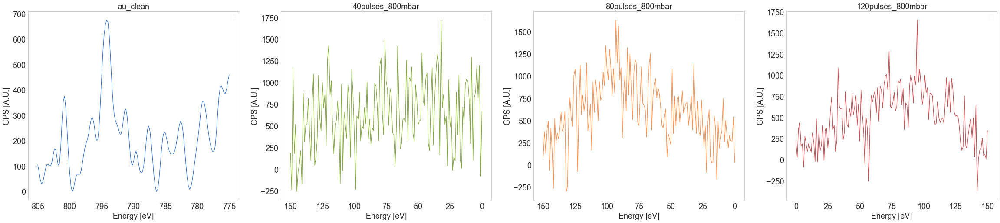

In [185]:
region = 'Ba_3d'
colors = ['b', 'g', 'y', 'r']
fig, ax = plt.subplots(1, 4, figsize=(40, 8))
for i,xp in enumerate(scaled_exps):
    if i == 0:   # Set labels from last region
        li = plot_region(xp, 'Ba_3d', ax=ax[i], lb='__nolabel__')
    else:
        dfsub = xp.dfx[region].counts-scaled_exps[0].dfx[region].counts
        li = ax[i].plot(dfsub, label='__nolabel__')[0]
    if len(colors) > 0: li.set_color(colors[i])
    ax[i].set_title(xp.name)
    cosmetics_plot(ax=ax[i])
# plt.tight_layout()

## Store processed experiments

In [186]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# ALI injections 200 mbar
40, 80 and 120 pulses

At $t_{on}$ = 50 ms and C = 1µM

## Import data

In [136]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au788_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)
files = files_new[6:10]

for f in files:
    print(os.path.split(f)[1])

20191018_Au(788)_clean.xy
20191023_FBI_Ba_1uM_40pulse_50ms_Au(788)_350mbar.xy
20191023_FBI_Ba_1uM_80pulse_50ms_Au(788)_350mbars.xy
20191025_FBI_Ba_1uM_120pulse_50ms_Au(788)_350mbar.xy


In [137]:
names = ['au_clean', '40pulses_200mbar', '80pulses_200mbar', '120pulses_200mbar']
label = ['Au(788) clean', 'FBI-Ba 40pulses, 200mbar GAr', 'FBI-Ba 80pulses, 200mbar GAr', 'FBI-Ba 120pulses, 200mbar GAr']

experiments = [xps_data_import(path=f, name=n, label=l) for f,n,l in zip(files, names, label)]
experiments[1].name

'40pulses_200mbar'

## Bg subtraction

In [138]:
region = 'overview_'

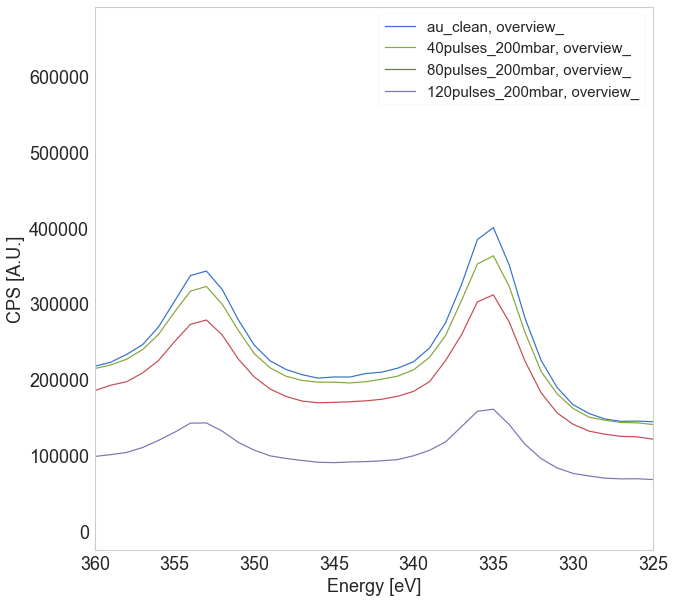

In [139]:
plt.figure(figsize=(10,10))
for xp in experiments:
    plot_region(xp, 'overview_')
plt.xlim(325, 360)
cosmetics_plot()

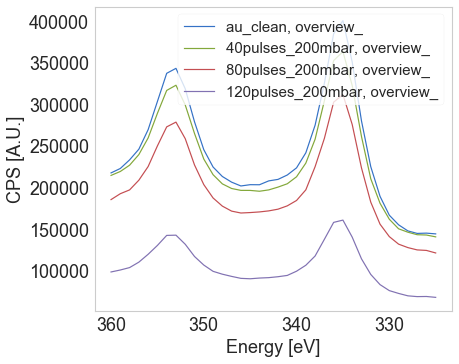

In [140]:
trim_exps = []
for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=360, edw=325)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
cosmetics_plot()

### Subtract double shirley to all Au regions

In [141]:
region = 'overview_'

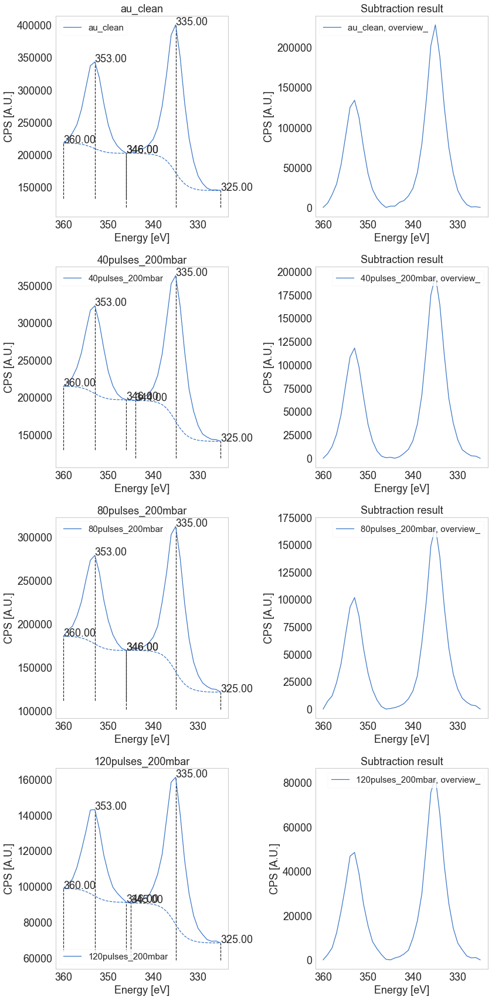

In [142]:
bg_exps = region_2bg_subtract(trim_exps, region=region, xlim=346)

### Bulk subtract background

Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline


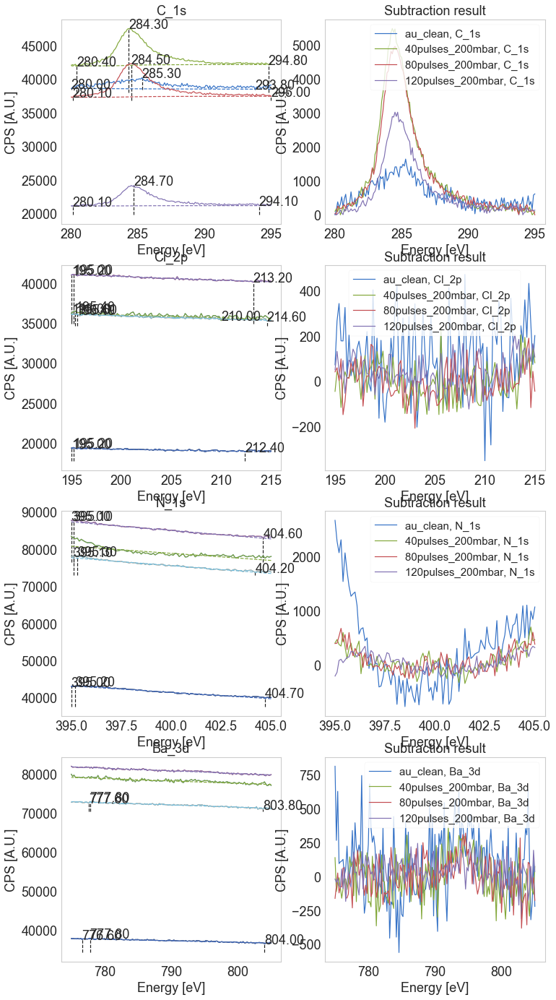

In [143]:
regions = ['C_1s', 'Cl_2p', 'N_1s', 'Ba_3d']
bg_exps = bulk_bg_subtract(bg_exps, regions)

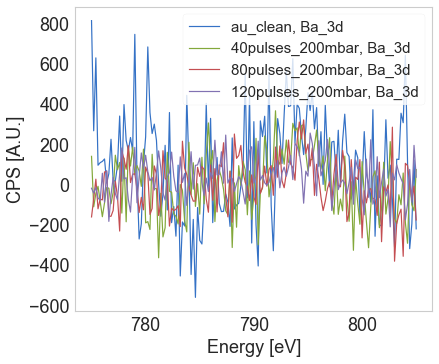

In [144]:
region = 'Ba_3d'
for xp in bg_exps:
    plot_region(xp, region)

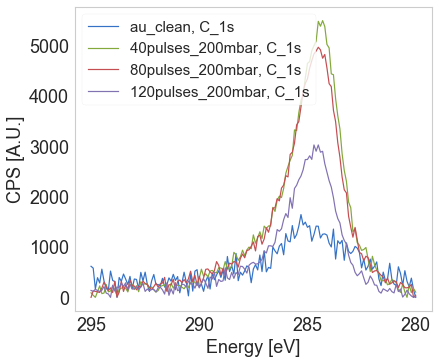

In [145]:
region = 'C_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

### Review Ba 3d subtraction and smoothen

In [146]:
region = 'Ba_3d'

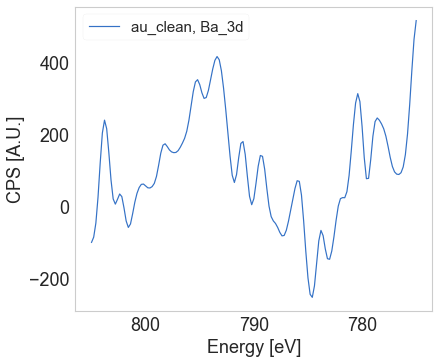

In [147]:
bg_ba = gaussian_smooth(bg_exps[0], region, sigma=2)
plot_region(bg_ba, region)

Max iterations exceeded, subtract linear baseline


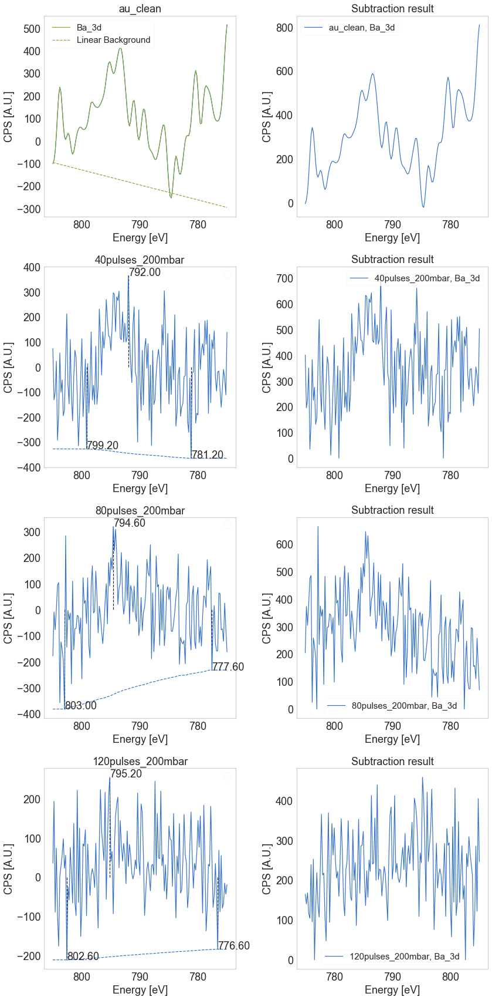

In [148]:
bg_exps = region_bg_subtract(bg_exps, 'Ba_3d')

### Subtract linear and shirley bg to all O 1s regions

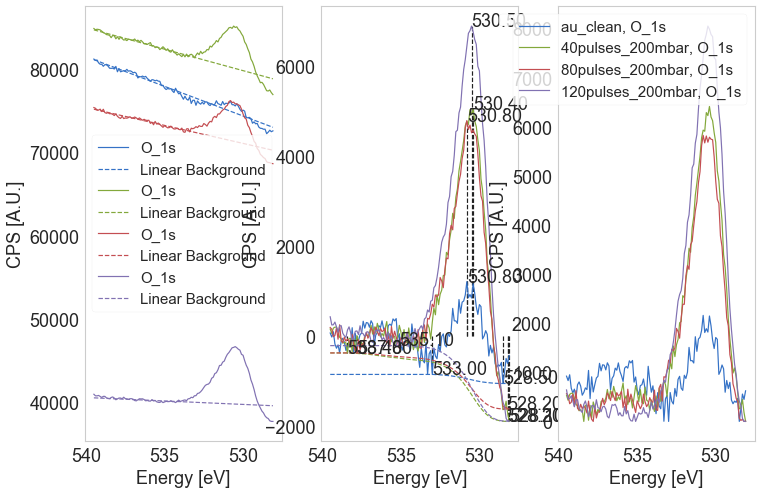

In [149]:
region = 'O_1s'
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=539.5, edw=528)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

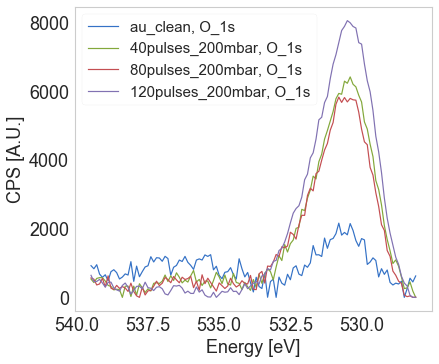

In [150]:
region = 'O_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

## Scale to Au 4f

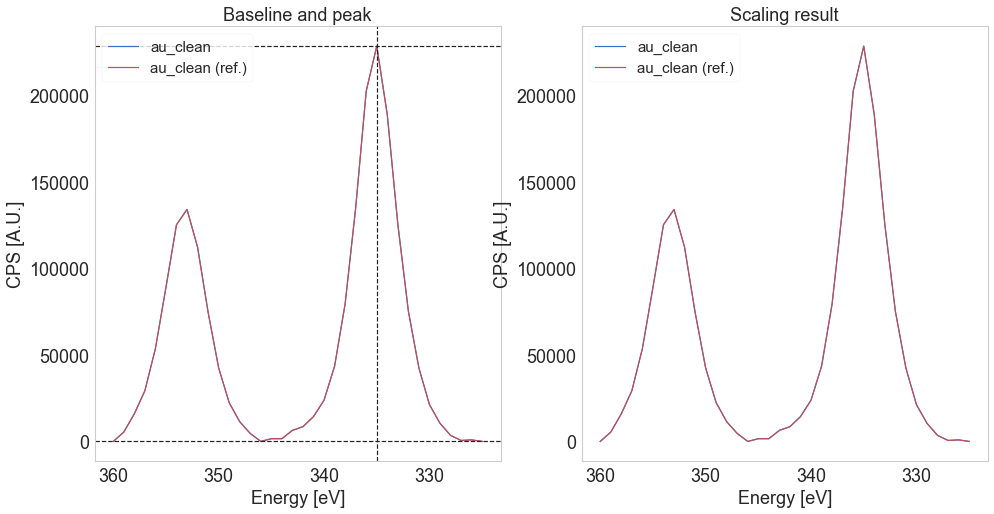

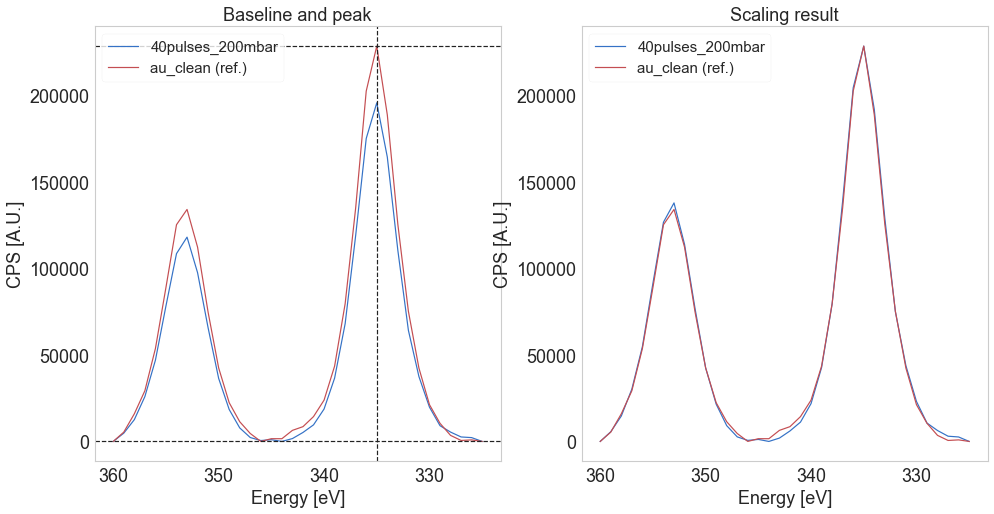

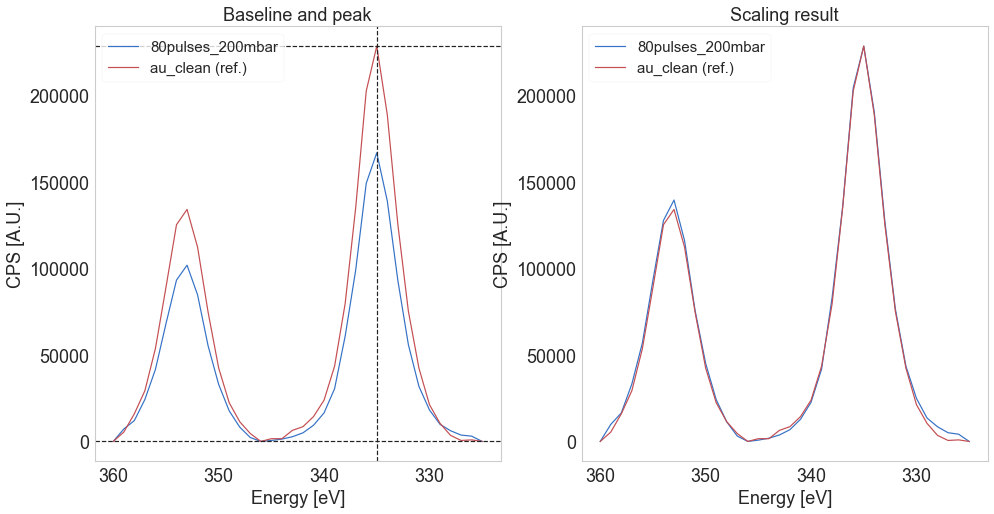

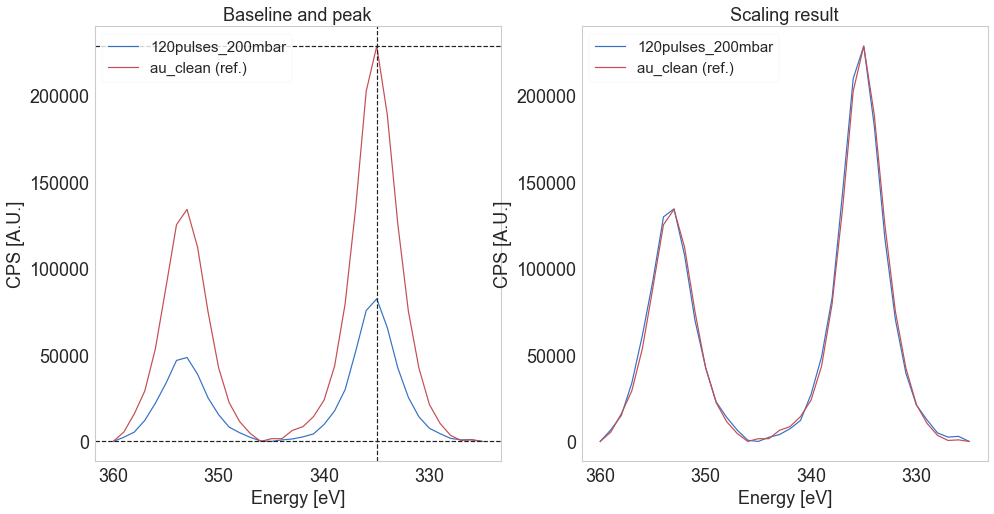

In [151]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'overview_')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

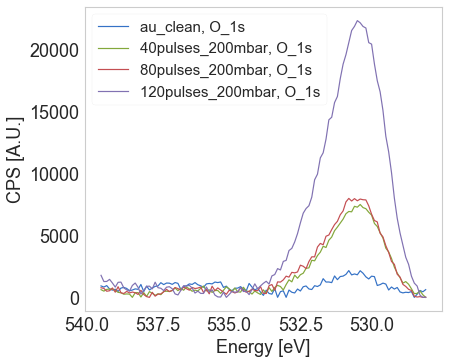

In [152]:
for xp in scaled_exps:
    plot_region(xp, 'O_1s')
cosmetics_plot()

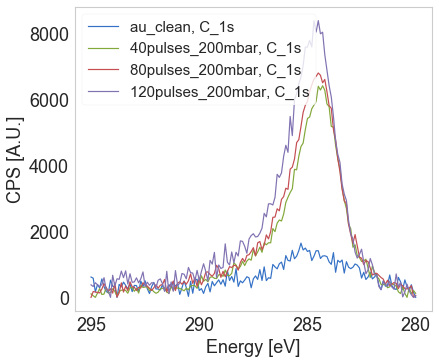

In [153]:
for xp in scaled_exps:
    plot_region(xp, 'C_1s')
cosmetics_plot()

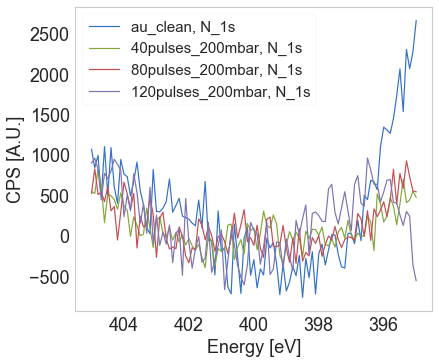

In [154]:
for xp in scaled_exps:
    plot_region(xp, 'N_1s')
cosmetics_plot()

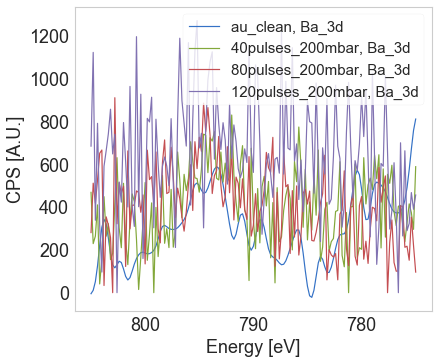

In [155]:
for xp in scaled_exps:
    plot_region(xp, 'Ba_3d')
cosmetics_plot()

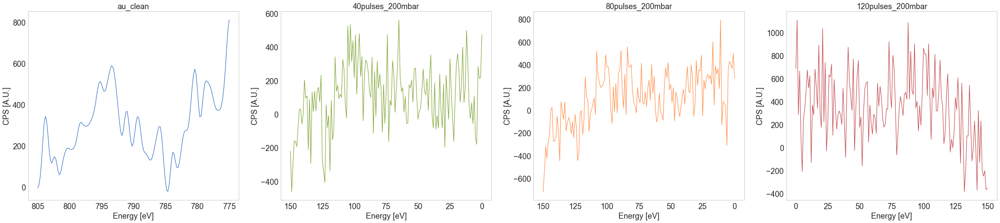

In [156]:
region = 'Ba_3d'
colors = ['b', 'g', 'y', 'r']
fig, ax = plt.subplots(1, 4, figsize=(40, 8))
for i,xp in enumerate(scaled_exps):
    if i == 0:   # Set labels from last region
        li = plot_region(xp, 'Ba_3d', ax=ax[i], lb='__nolabel__')
    else:
        dfsub = xp.dfx[region].counts-scaled_exps[0].dfx[region].counts
        li = ax[i].plot(dfsub, label='__nolabel__')[0]
    if len(colors) > 0: li.set_color(colors[i])
    ax[i].set_title(xp.name)
    cosmetics_plot(ax=ax[i])
# plt.tight_layout()

## Store processed experiments

In [157]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# FBI dropcast data

## Import raw spectra

In [15]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au788_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)
files = files_new[10:]

for f in files:
    print(os.path.split(f)[1])

20191028_Au(788)_clean.xy
20191028_FBI_dropcast_1mM_Au(788).xy
20191029_Au(788)_sputter_1500ev.xy
20191030_FBI_Ba_Au(788)_sputter_2kev.xy
20191031_FBI_Ba_Au(788)_2ndSputter_2kev.xy


In [16]:
names = ['au_clean', 'FBI_dropcast_1mM', 'FBI_sputter1500', 'FBI_sputter2000a', 'FBI_sputter2000b']
label = ['Au(788) clean', 'FBI-Ba 2 droplet dropcast 1mM', 'FBI-Ba 1st sputter 1.5 keV', 'FBI-Ba 2nd sputter 2 keV', 'FBI-Ba 3rd sputter 2 keV']

experiments = [xps_data_import(path=f, name=n, label=l) for f,n,l in zip(files, names, label)]
experiments[1].name

'FBI_dropcast_1mM'

## Bg subtraction

In [200]:
region = 'overview'

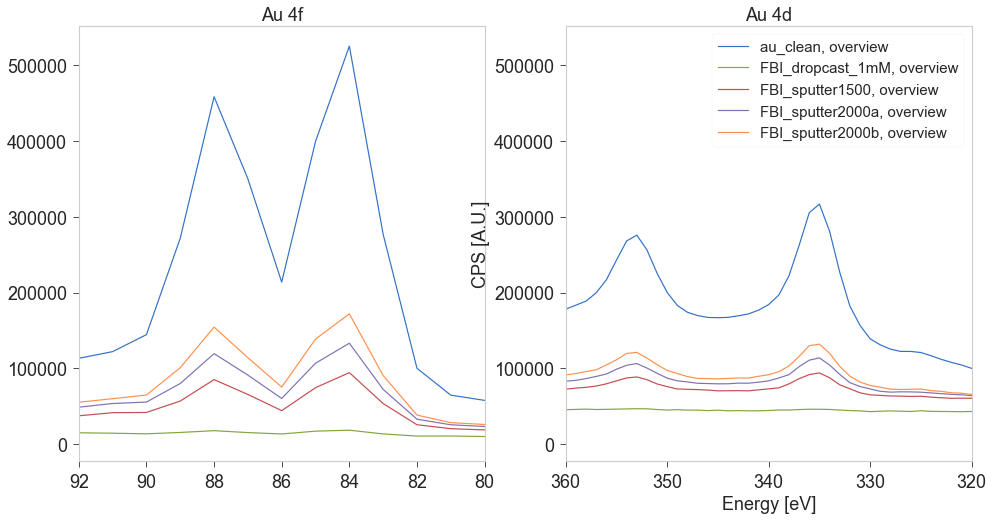

In [198]:

fig, ax = plt.subplots(1,2, figsize=(16,8))
for xp in experiments:
    plot_region(xp, 'overview', ax=ax[0])
    ax[0].set_xlim(92, 80)
    ax[0].set_title('Au 4f')
    
    plot_region(xp, 'overview', ax=ax[1])
    ax[1].set_xlim(360, 320)
    ax[1].set_title('Au 4d')

### Trim overview to Au 4f region

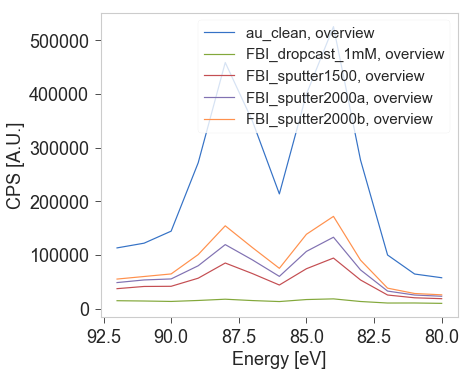

In [201]:
trim_exps = []
for xp in experiments:
    xp_new = crop_spectrum(xp, region='overview', eup=92, edw=80)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
cosmetics_plot()
plt.gca().invert_xaxis()

### Compare two different overviews

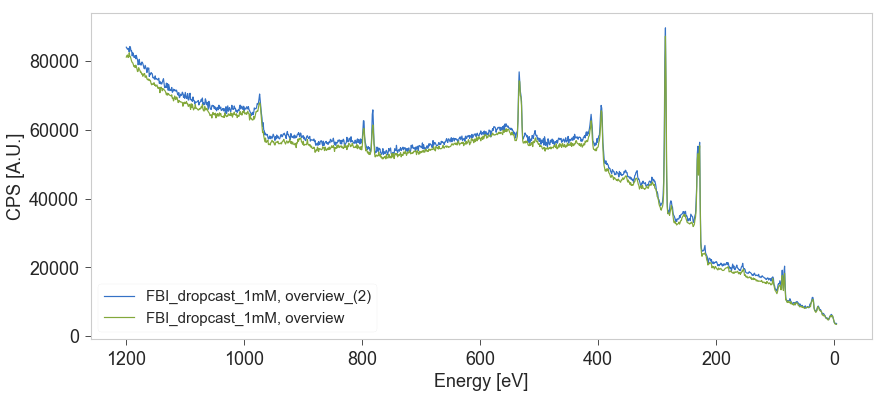

In [20]:
plt.figure(figsize=(14,6))
plot_region(experiments[1], 'overview_(2)')
plot_region(experiments[1], 'overview')
# plt.xlim(325, 360)
# plt.ylim(4e4, 5e4)
cosmetics_plot()

(4000.0, 21000.0)

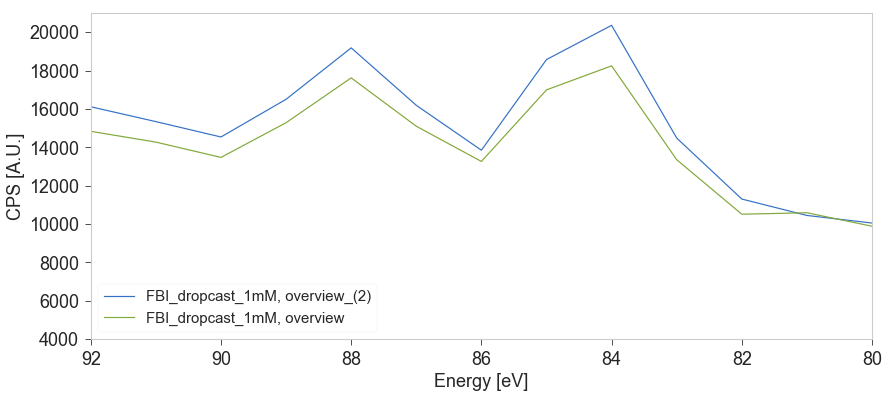

In [21]:
plt.figure(figsize=(14,6))
plot_region(experiments[1], 'overview_(2)')
plot_region(experiments[1], 'overview')
plt.xlim(92, 80)
plt.ylim(4e3, 2.1e4)
# cosmetics_plot()

### Subtract double shirley to all Au regions

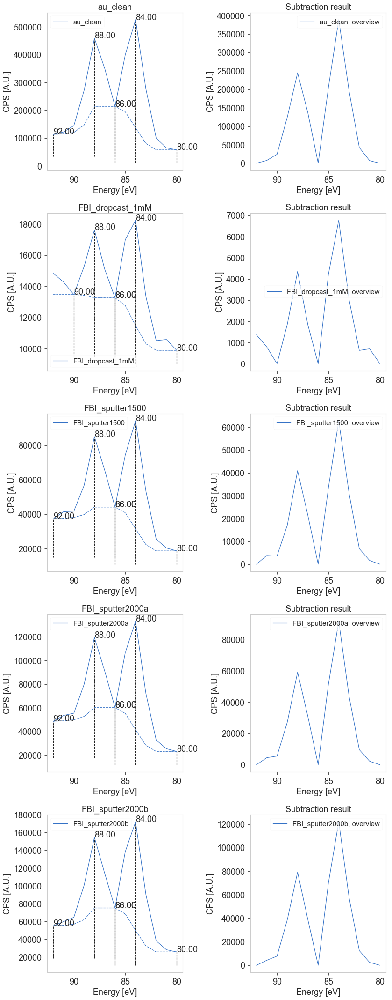

In [202]:
region = 'overview'

bg_exps = region_2bg_subtract(trim_exps, region=region, xlim = 86)

### Bulk subtract background

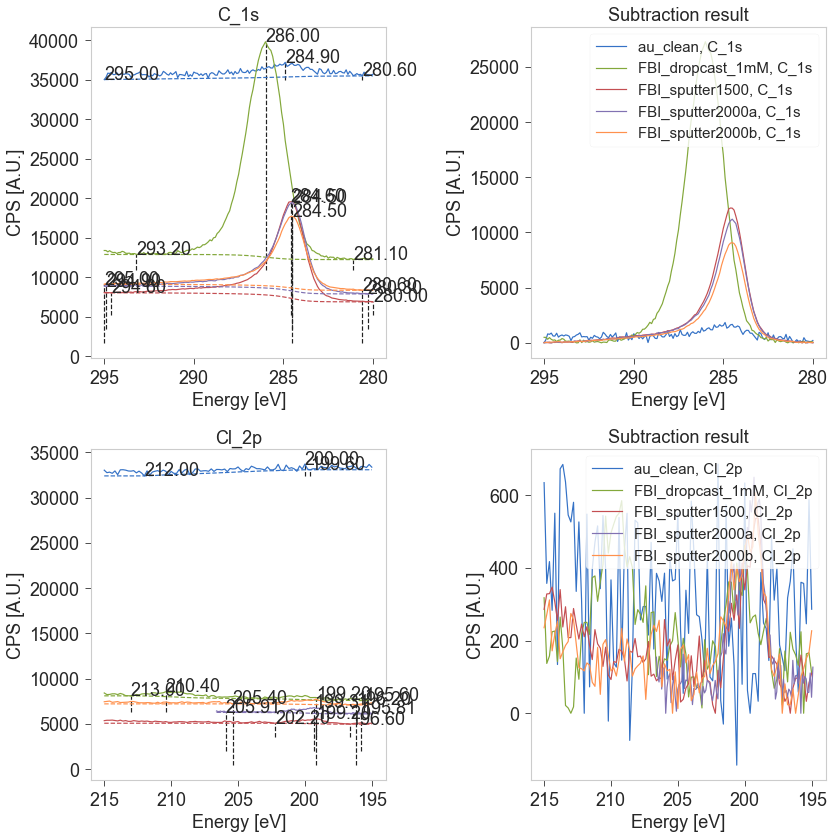

In [203]:
regions = ['C_1s', 'Cl_2p']
bg_exps = bulk_bg_subtract(bg_exps, regions)

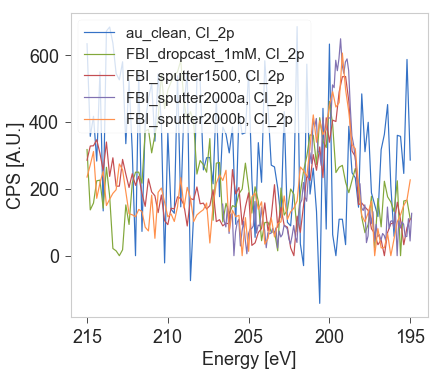

In [165]:
region = 'Cl_2p'
for xp in bg_exps:
    plot_region(xp, region)

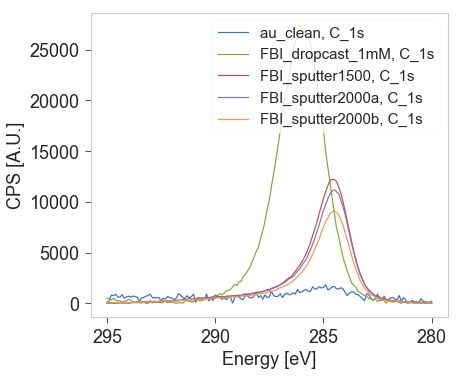

In [166]:
region = 'C_1s'
for xp in bg_exps:
    plot_region(xp, region)

### Review Ba 3d bg with double shirley

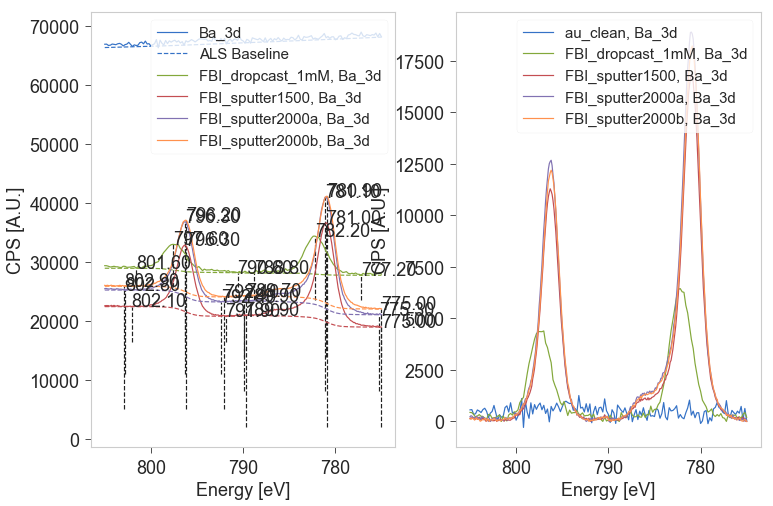

In [204]:
region = 'Ba_3d'

fig, ax = plt.subplots(1, 2, figsize=(12, 8))
new_exps = []
for i,xp in enumerate(bg_exps):
    if i == 0:
        xp_bg = subtract_als_bg(xp, region, ax=ax[0])
    else:
        xp_bg = subtract_double_shirley(xp, region, xlim=790, maxit=40, flag_plot=True, ax=ax[0])
    plot_region(xp_bg, region, ax=ax[1])
    new_exps.append(xp_bg)
for i in range(2): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

#### Ba 3d (2)

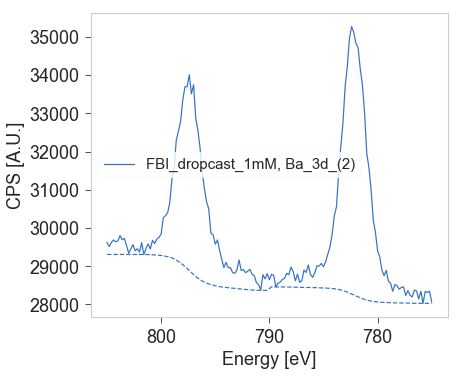

In [405]:
region = 'Ba_3d_(2)'
bg_exps2 = subtract_double_shirley(trim_exps[1], region, xlim=790)

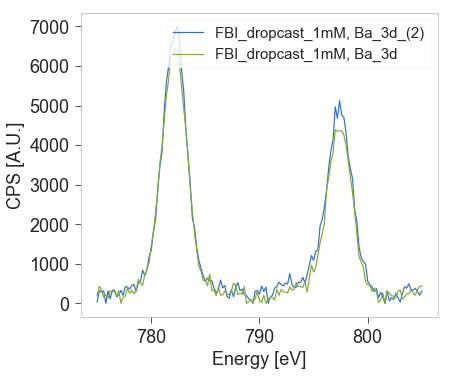

In [406]:
plot_region(bg_exps2, 'Ba_3d_(2)')
plot_region(bg_exps[1], 'Ba_3d')

### Subtract linear and shirley bg to all O 1s regions

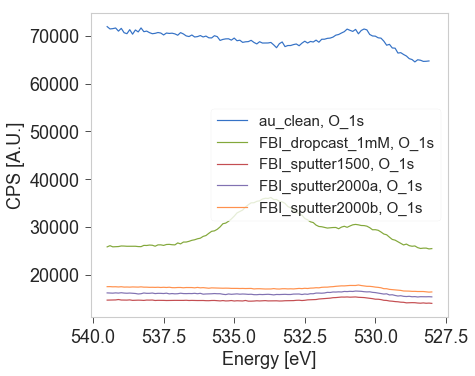

In [205]:
region = 'O_1s'
trim_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=539.5, edw=528)
    plot_region(xp_crop, region)
    trim_exps.append(xp_crop)
# bg_exps = trim_exps

Max iterations exceeded, subtract linear baseline


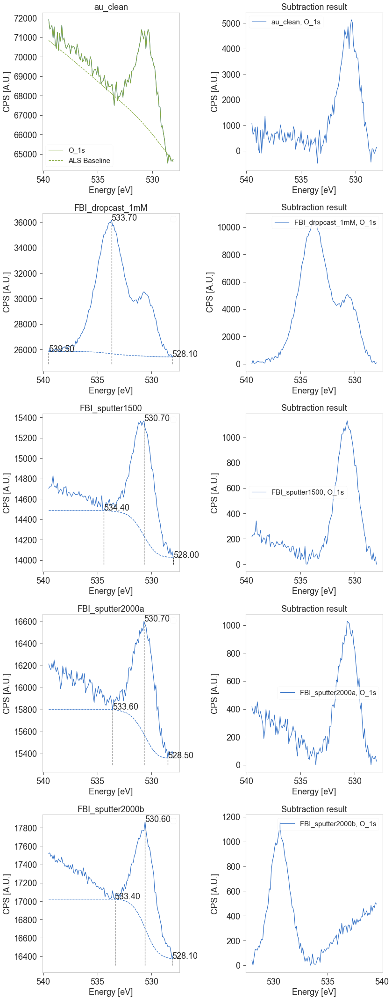

In [206]:
bg_exps = region_bg_subtract(trim_exps, region)

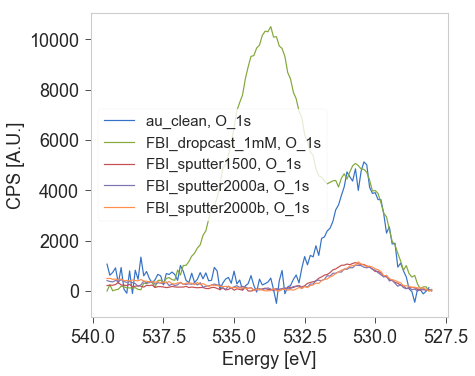

In [207]:
region = 'O_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()
plt.gca().invert_xaxis()

### Subtract linear+double shirley to all N 1s regions

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


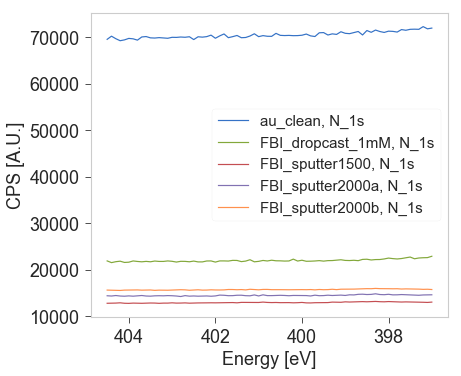

In [208]:
region = 'N_1s'
trim_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=404.5, edw=397)
    plot_region(xp_crop, region)
    trim_exps.append(xp_crop)
# bg_exps = trim_exps

Max iterations exceeded, subtract linear baseline
Max iterations exceeded, subtract linear baseline


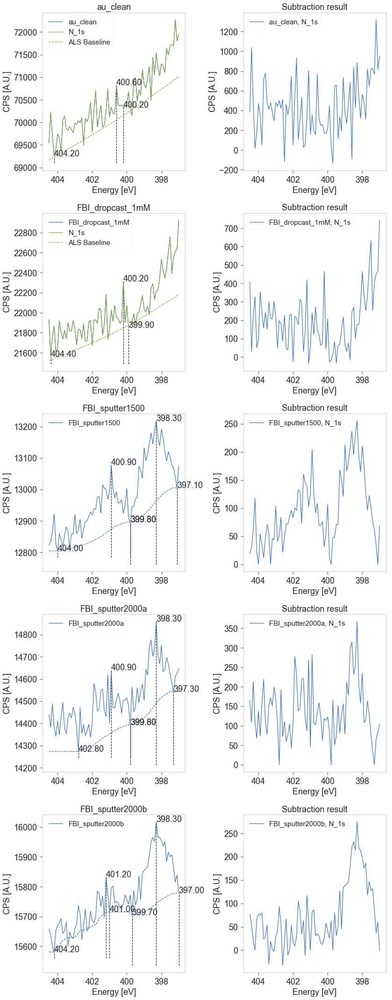

In [211]:
bg_exps = region_2bg_subtract(trim_exps, region, xlim=399.8);

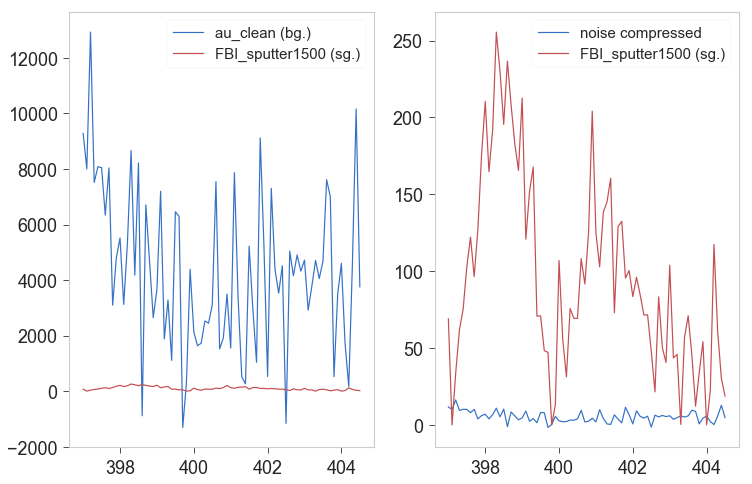

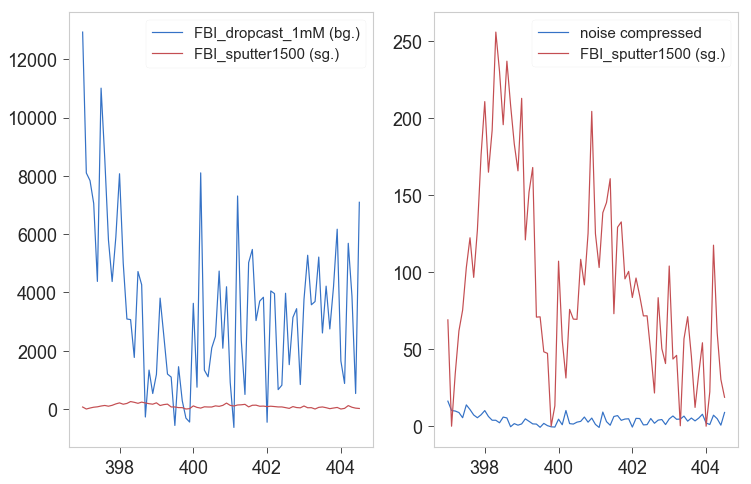

In [213]:
region = 'N_1s'

for i, xp in enumerate(bg_exps[:2]):
    compress_noisy_region(xp, bg_exps[2], region, inplace=True)
# for i in range(3): cosmetics_plot(ax=ax[i])

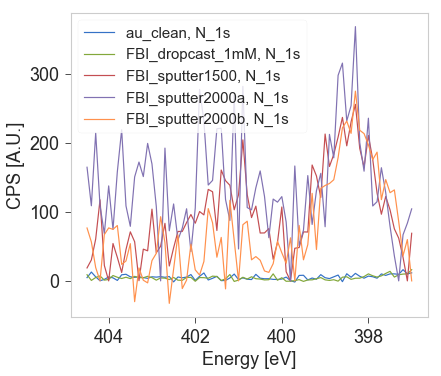

In [214]:
region = 'N_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()
plt.gca().invert_xaxis()

### Cl 2s

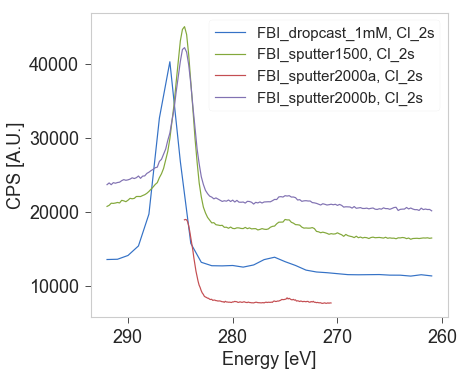

In [215]:
region = 'Cl_2s'
for xp in bg_exps[1:]:
    plot_region(xp, region)
# plt.xlim(280, 260)
# plt.ylim(5.5e3, 25e3)
# plt.yscale('log')
plt.gca().invert_xaxis()

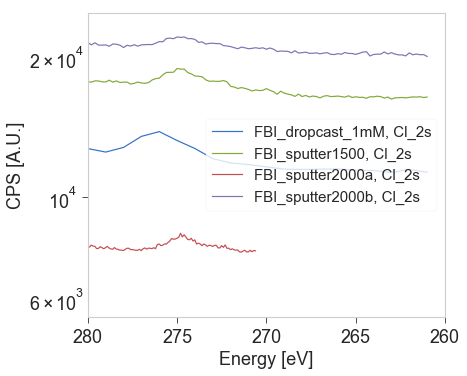

In [216]:
region = 'Cl_2s'
for xp in bg_exps[1:]:
    plot_region(xp, region)
plt.xlim(280, 260)
plt.ylim(5.5e3, 25e3)
plt.yscale('log')
# plt.gca().invert_xaxis()

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


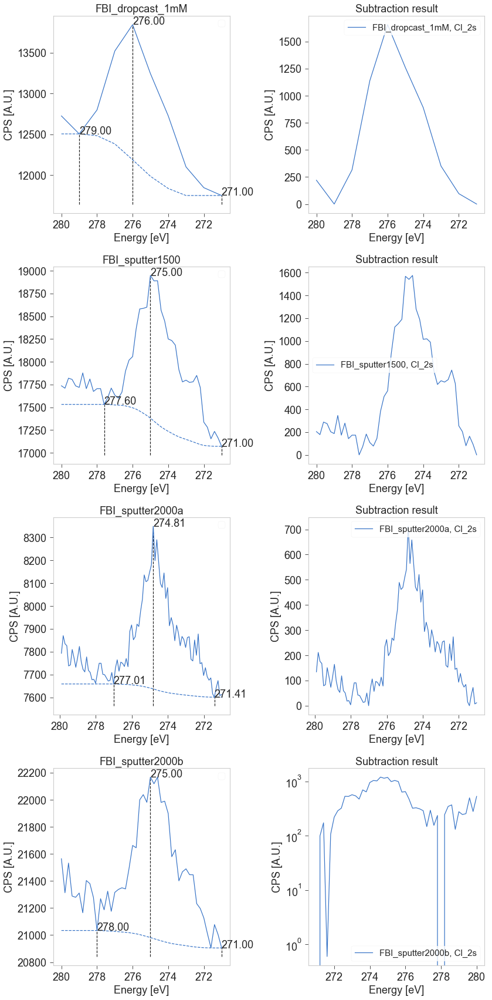

In [217]:
region = 'Cl_2s'

fig, ax = plt.subplots(len(bg_exps[1:]), 2, figsize=(12, 6 * len(bg_exps[1:])))
for j, xp in enumerate(bg_exps[1:]):
    xp_crop = crop_spectrum(xp, region, eup=280, edw=271)
    
    try:
        xp_bg = subtract_shirley_bg(xp_crop, region, maxit=100, lb='__nolabel__', ax = ax[j][0])
    except AssertionError:
        print('Max iterations exceeded, subtract linear baseline')
        xp_bg = subtract_linear_bg(xp_crop, region, lb='__nolabel__', ax = ax[j][0])

    xp.dfx[region] = xp_bg.dfx[region]
    plot_region(xp_bg, region, ax=ax[j][1])
    ax[j][0].set_title(xp.name)
    ax[j][1].set_title('Subtraction result')
    for i in range(2): cosmetics_plot(ax=ax[j][i])
fig.tight_layout()

plt.yscale('log')
plt.gca().invert_xaxis()

## Scale to Au 4f

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


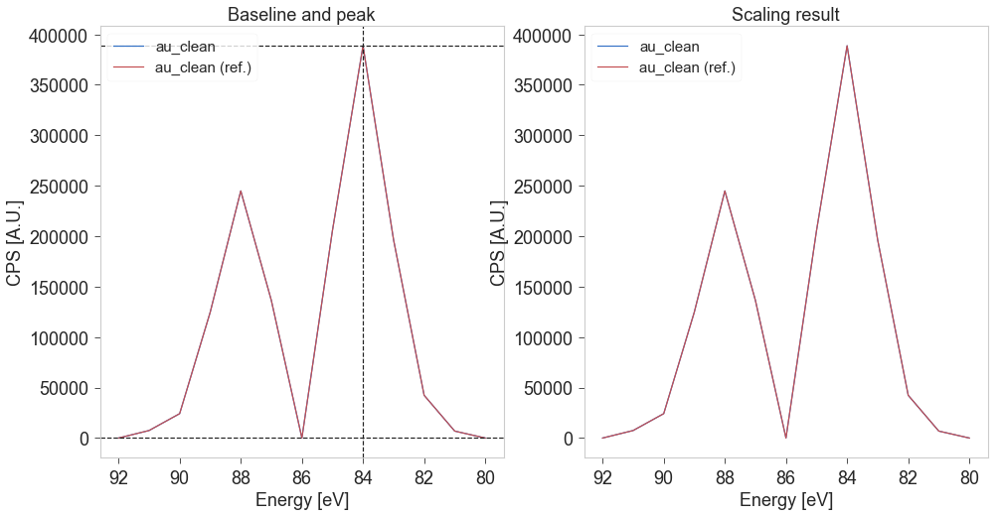

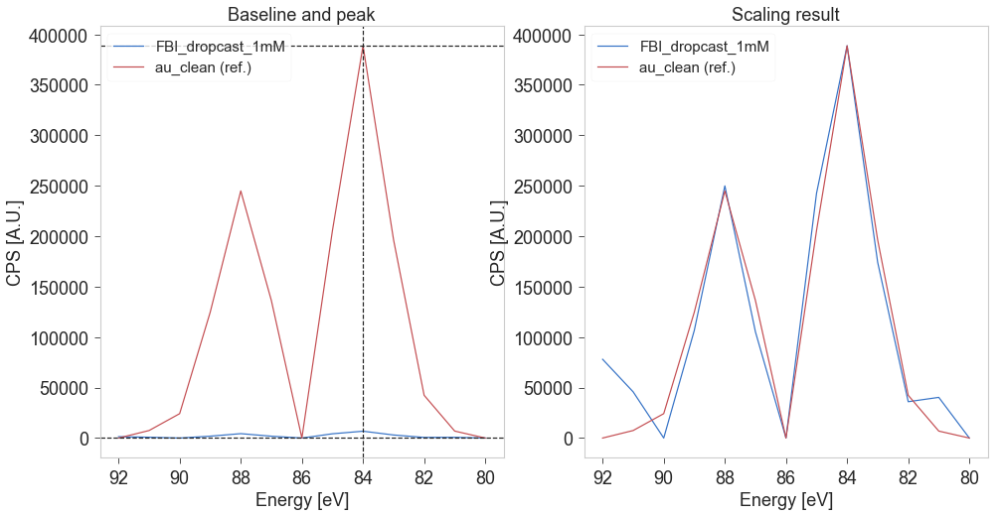

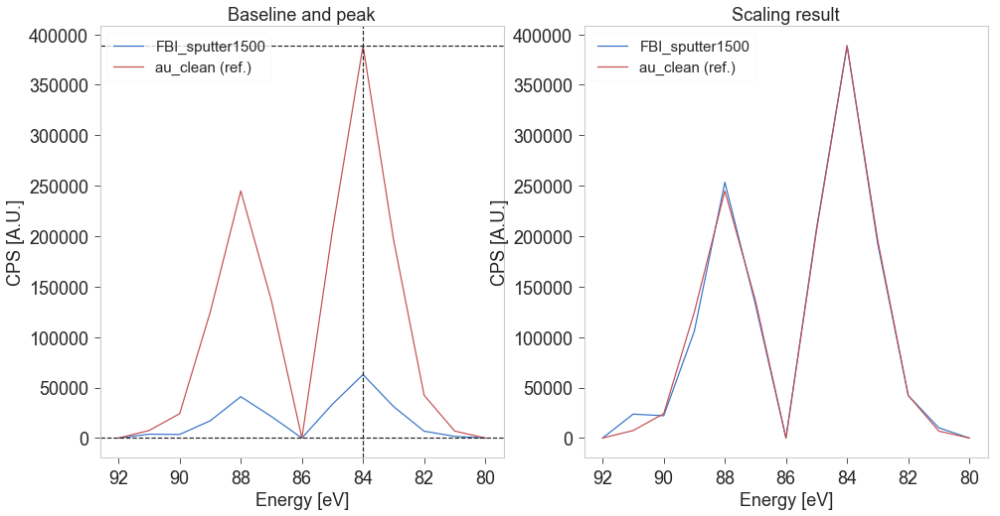

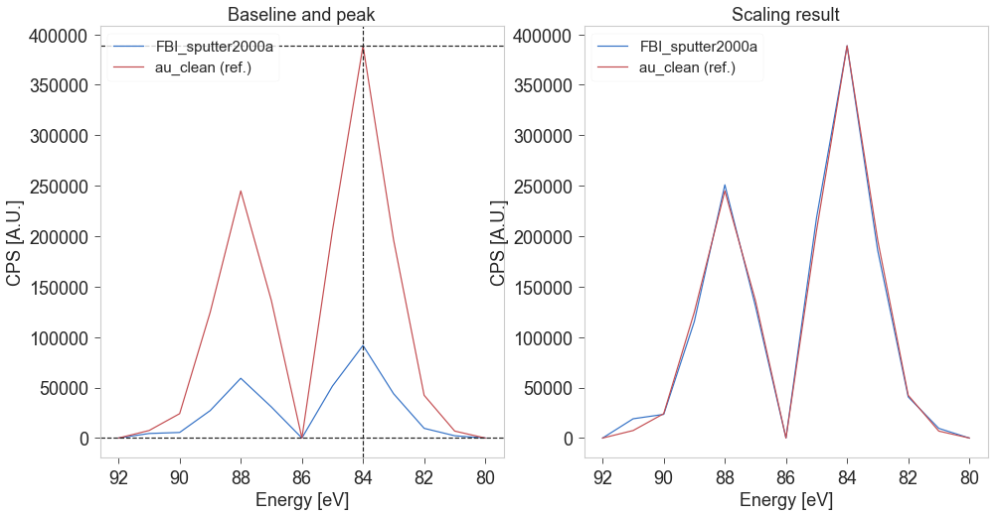

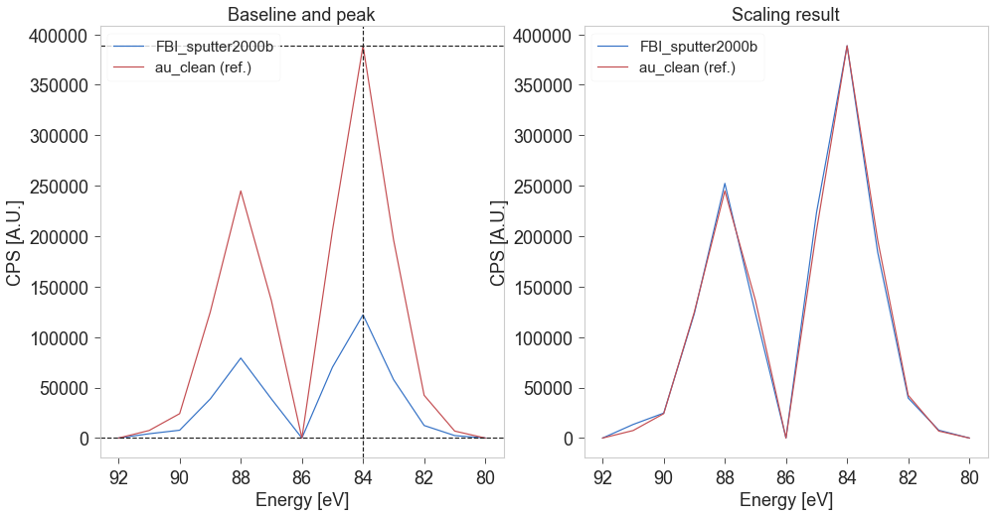

In [218]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'overview')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

### Check scaling

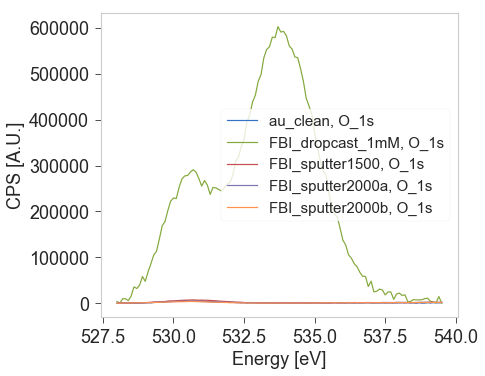

In [219]:
for xp in scaled_exps:
    plot_region(xp, 'O_1s')
cosmetics_plot()

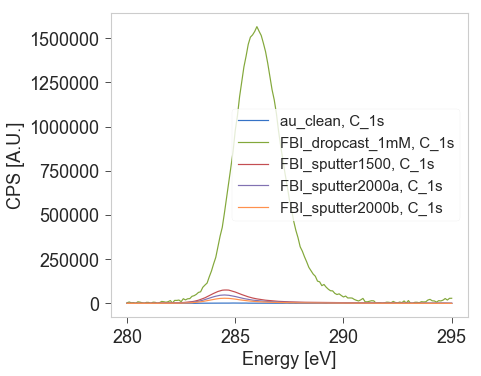

In [220]:
for xp in scaled_exps:
    plot_region(xp, 'C_1s')
cosmetics_plot()

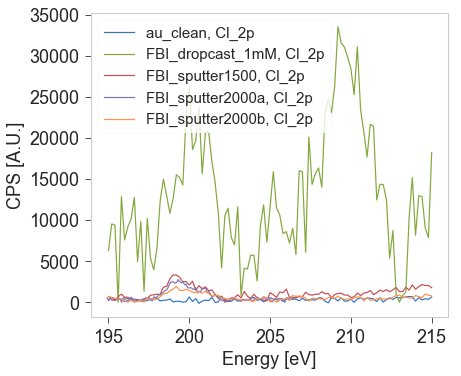

In [221]:
for xp in scaled_exps:
    plot_region(xp, 'Cl_2p')
cosmetics_plot()

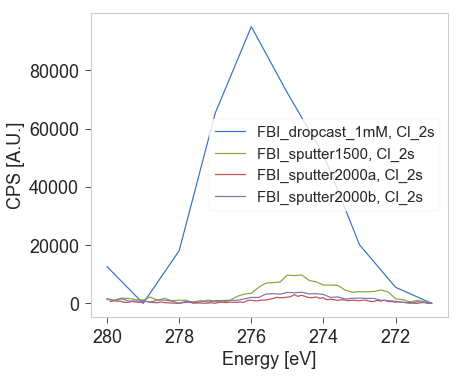

In [222]:
for xp in scaled_exps[1:]:
    plot_region(xp, 'Cl_2s')
cosmetics_plot()

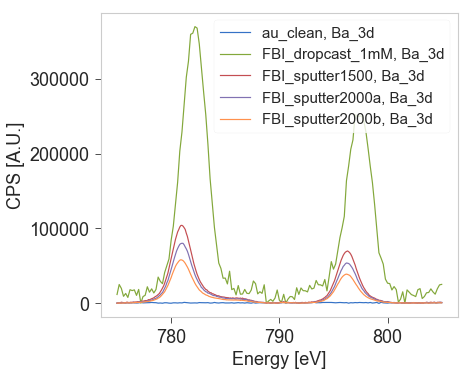

In [223]:
for xp in scaled_exps:
    plot_region(xp, 'Ba_3d')
cosmetics_plot()

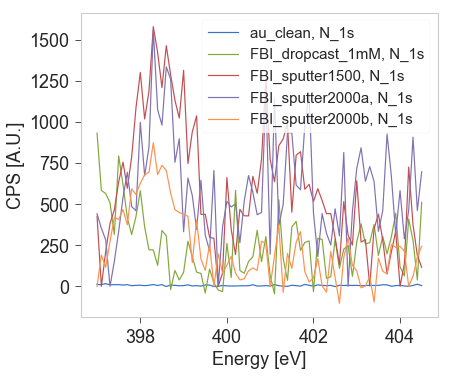

In [224]:
for xp in scaled_exps:
    plot_region(xp, 'N_1s')
cosmetics_plot()

### Scale Ba(2) and overview(2) in Dropcast set
These were measured on the same dropcast sample, untouched, just as the first round of measurements finished to check if any change was perceptible just by time passing by

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


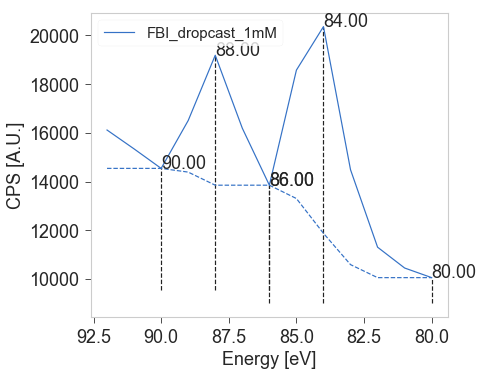

In [462]:
regions = ['overview_(2)', 'Ba_3d_(2)']
au2_trim = crop_spectrum(experiments[1], regions[0], edw=80, eup=92)
# plot_region(au2_trim, regions[0])

au2_bg = subtract_double_shirley(au2_trim, regions[0], xlim=86, maxit=100, lb=au2_trim.name, flag_plot=True)
au2_bg.dfx.drop('overview', axis=1, inplace=True)
au2_bg.dfx.rename(columns=({'overview_(2)':'overview'}), inplace = True)

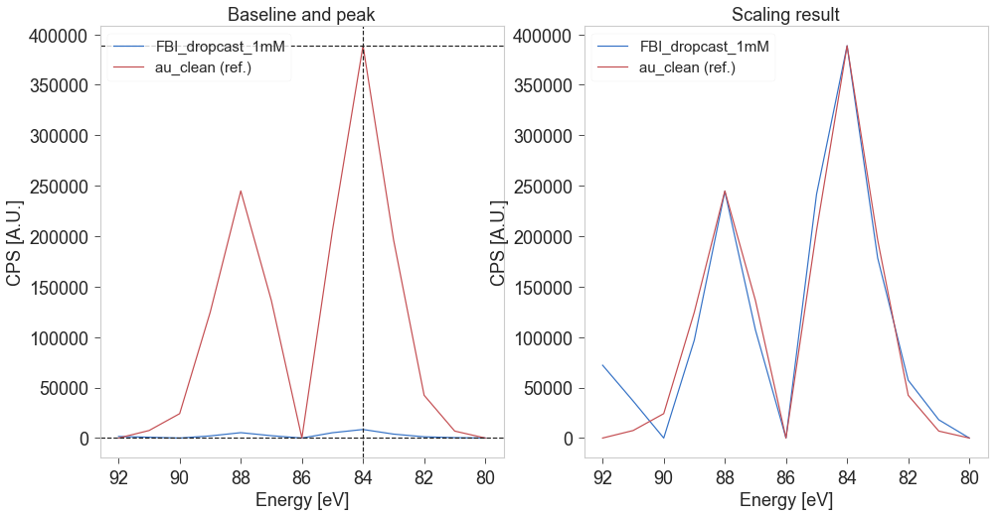

In [460]:
scalef = scale_and_plot_spectra(au2_bg, bg_exps[0], region='overview')
au2_scaled = scale_dfx(au2_bg, scalef)

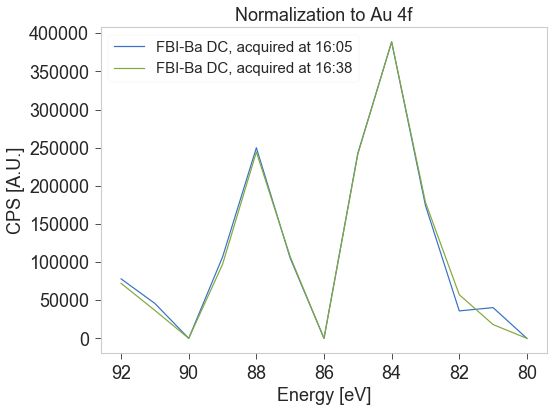

In [503]:
plt.figure(figsize=(8,6))
plot_region(scaled_exps[1], 'overview', lb='FBI-Ba DC, acquired at 16:05')
plot_region(au2_scaled, 'overview', lb='FBI-Ba DC, acquired at 16:38')
cosmetics_plot()
plt.title('Normalization to Au 4f')
plt.legend(loc='upper left')

#### Ba(2)

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


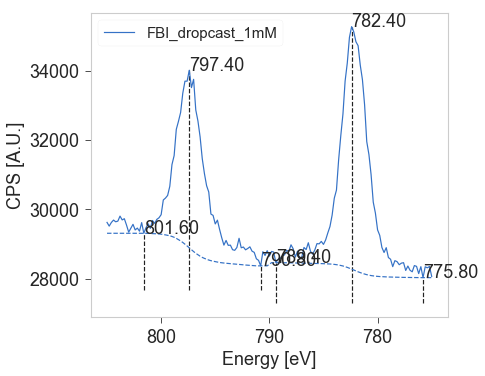

In [474]:
ba2_bg = subtract_double_shirley(au2_bg, regions[1], xlim= 790, maxit=100, lb=experiments[1].name, flag_plot=True)
ba2_bg.dfx.drop('Ba_3d', axis=1, inplace=True)
ba2_bg.dfx.rename(columns=({'Ba_3d_(2)':'Ba_3d'}), inplace = True)

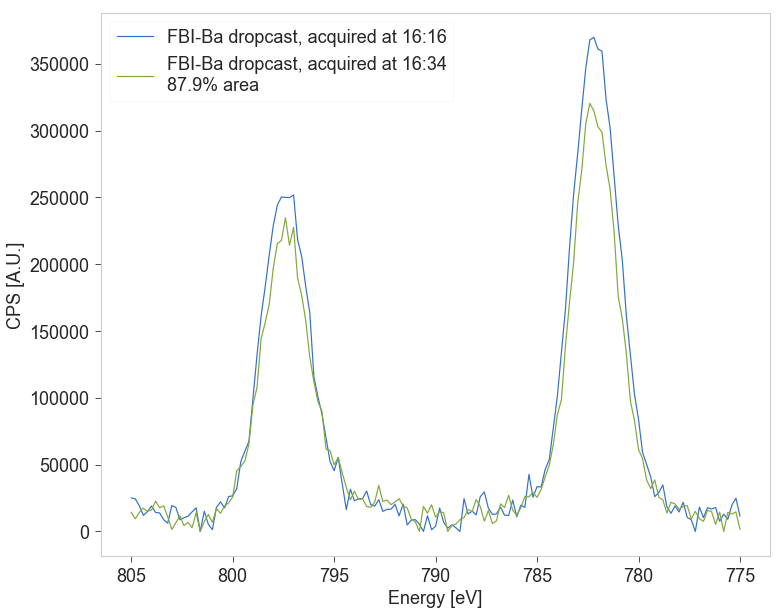

In [496]:
plt.figure(figsize=(12, 10))
ba2_scaled = scale_dfx(ba2_bg, scalef)
plot_region(scaled_exps[1], 'Ba_3d', lb='FBI-Ba dropcast, acquired at 16:16')
plot_region(ba2_scaled, 'Ba_3d', lb='FBI-Ba dropcast, acquired at 16:34\n87.9% area')
cosmetics_plot()
plt.legend(loc='upper left', fontsize=18)

(0.8798334806684144, 1887840.8563722284)

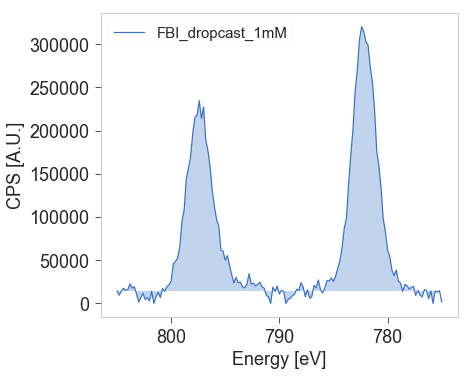

In [485]:
compare_areas(xp_ref=scaled_exps[1], xp_sg=ba2_scaled, region='Ba_3d',
             lmidx=0, rmidx=150, flag_fill=True)

## Store processed experiments

In [225]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)